<a href="https://colab.research.google.com/github/sourangshupal/Yolov5_Custom_Training/blob/main/Roboflow_Custom_YOLOv5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# How to Train YOLOv5 on Custom Objects

This tutorial is based on the [YOLOv5 repository](https://github.com/ultralytics/yolov5) by [Ultralytics](https://www.ultralytics.com/). This notebook shows training on **your own custom objects**. Many thanks to Ultralytics for putting this repository together - we hope that in combination with clean data management tools at Roboflow, this technologoy will become easily accessible to any developer wishing to use computer vision in their projects.

### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train YOLOv5](https://blog.roboflow.ai/how-to-train-yolov5-on-a-custom-dataset/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train YOLOv5 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install YOLOv5 dependencies
* Download custom YOLOv5 object detection data
* Write our YOLOv5 Training configuration
* Run YOLOv5 training
* Evaluate YOLOv5 performance
* Visualize YOLOv5 training data
* Run YOLOv5 inference on test images
* Export saved YOLOv5 weights for future inference



### **About**

[Roboflow](https://roboflow.com) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

**Looking for a vision model available via API without hassle? Try Roboflow Train.**

![Roboflow Wordmark](https://i.imgur.com/dcLNMhV.png)



#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
# install dependencies as necessary
#!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
#from utils.google_utils import gdrive_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__,torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 1.10.0+cu113 _CudaDeviceProperties(name='NVIDIA GeForce RTX 3050 Laptop GPU', major=8, minor=6, total_memory=4095MB, multi_processor_count=16)


# Define Model Configuration and Architecture

We will write a yaml script that defines the parameters for our model like the number of classes, anchors, and each layer.

You do not need to edit these cells, but you may.

In [2]:
# define number of classes based on YAML
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [3]:
num_classes

'3'

# Train Custom YOLOv5 Detector

### Next, we'll fire off training!


Here, we are able to pass a number of arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights. (Note: you can download weights from the Ultralytics Google Drive [folder](https://drive.google.com/open?id=1Drs_Aiu7xx6S-ix95f9kNsA6ueKRpN2J))
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [4]:
import os
print(os.getcwd())
%cd D:/yolov5_roboflow/yolov5
print(os.getcwd())

D:\yolov5_roboflow
D:\yolov5_roboflow\yolov5
D:\yolov5_roboflow\yolov5


In [5]:
%ls

 Volume in drive D is Ironman
 Volume Serial Number is 54C6-7DF2

 Directory of D:\yolov5_roboflow\yolov5

31-10-2021  16:48    <DIR>          .
31-10-2021  17:58    <DIR>          ..
31-10-2021  14:02             3,826 .dockerignore
31-10-2021  13:57                77 .gitattributes
31-10-2021  14:02    <DIR>          .github
31-10-2021  14:02             4,228 .gitignore
31-10-2021  15:04    <DIR>          __pycache__
31-10-2021  14:02    <DIR>          data
31-10-2021  15:40               117 data.yaml
31-10-2021  15:43               117 data1.txt
31-10-2021  14:02             8,393 detect.py
31-10-2021  14:02             1,770 Dockerfile
31-10-2021  14:02             5,420 hubconf.py
31-10-2021  14:02            35,799 LICENSE
31-10-2021  15:11    <DIR>          models
31-10-2021  14:02            10,953 README.md
31-10-2021  14:02               634 requirements.txt
31-10-2021  16:48    <DIR>          runs
31-10-2021  14:02            16,868 test.py
31-10-2021  17:44            32,

In [26]:
!python train.py --img 416 --batch 4 --epochs 100 --data data.yaml --cfg ./models/yolov5s.yaml --weights '' --name yolov5s_results --workers 2  --cache

github:  WARNING: code is out of date by 621 commits. Use 'git pull' to update or 'git clone https://github.com/ultralytics/yolov5' to download latest.
Plotting labels... 

autoanchor: Analyzing anchors... anchors/target = 6.15, Best Possible Recall (BPR) = 0.9994
                 all          73         967      0.0225       0.313       0.021     0.00402
                 all          73         967      0.0225       0.313      0.0212     0.00439
                 all          73         967      0.0657        0.17      0.0362     0.00639
                 all          73         967      0.0244       0.246      0.0192     0.00351
                 all          73         967      0.0737       0.199      0.0508      0.0111
                 all          73         967       0.071       0.252      0.0569       0.011
                 all          73         967      0.0618       0.339      0.0484      0.0104
                 all          73         967      0.0472       0.371      0.0547    

YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu113 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4095.5MB)

Namespace(adam=False, batch_size=4, bucket='', cache_images=True, cfg='./models/yolov5s.yaml', data='data.yaml', device='', entity=None, epochs=100, evolve=False, exist_ok=False, global_rank=-1, hyp='data/hyp.scratch.yaml', image_weights=False, img_size=[416, 416], linear_lr=False, local_rank=-1, log_artifacts=False, log_imgs=16, multi_scale=False, name='yolov5s_results', noautoanchor=False, nosave=False, notest=False, project='runs/train', quad=False, rect=False, resume=False, save_dir='runs\\train\\yolov5s_results', single_cls=False, sync_bn=False, total_batch_size=4, weights="''", workers=2, world_size=1)
wandb: Install Weights & Biases for YOLOv5 logging with 'pip install wandb' (recommended)
Start Tensorboard with "tensorboard --logdir runs/train", view at http://localhost:6006/
hyperparameters: lr0=0.01, lrf=0.2, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentu

                 all          73         967       0.814        0.89       0.892       0.474
                 all          73         967       0.788       0.823       0.872       0.466
                 all          73         967       0.694       0.864       0.836       0.452
                 all          73         967       0.755       0.904       0.866       0.459
                 all          73         967       0.781       0.855        0.86       0.481
                 all          73         967       0.758       0.889       0.894       0.492
                 all          73         967       0.803       0.916       0.901       0.466
                 all          73         967       0.817       0.914       0.898       0.527
                 all          73         967        0.81       0.889       0.904       0.538
                 all          73         967       0.755       0.872        0.88       0.506
                 all          73         967       0.813       0.891  

      0/99    0.684G    0.1066    0.1692   0.03723    0.3131        86       416:  53%|#####3    | 34/64 [00:08<00:03,  9.41it/s]
      0/99    0.684G    0.1066    0.1692   0.03723    0.3131        86       416:  55%|#####4    | 35/64 [00:08<00:03,  9.48it/s]
      0/99    0.684G    0.1065    0.1677   0.03722    0.3114        60       416:  55%|#####4    | 35/64 [00:08<00:03,  9.48it/s]
      0/99    0.684G    0.1063    0.1664   0.03719    0.3098        62       416:  55%|#####4    | 35/64 [00:08<00:03,  9.48it/s]
      0/99    0.684G    0.1063    0.1664   0.03719    0.3098        62       416:  58%|#####7    | 37/64 [00:08<00:02, 10.01it/s]
      0/99    0.684G    0.1062    0.1683   0.03716    0.3116       133       416:  58%|#####7    | 37/64 [00:08<00:02, 10.01it/s]
      0/99    0.684G    0.1061    0.1699   0.03714    0.3131       121       416:  58%|#####7    | 37/64 [00:08<00:02, 10.01it/s]
      0/99    0.684G    0.1061    0.1699   0.03714    0.3131       121       416:  61%|###

      2/99    0.499G   0.08851     0.222   0.03183    0.3424        83       416:  14%|#4        | 9/64 [00:01<00:06,  9.16it/s]
      2/99    0.499G   0.08851     0.222   0.03183    0.3424        83       416:  16%|#5        | 10/64 [00:01<00:05,  9.20it/s]
      2/99    0.499G   0.08821    0.2236    0.0318    0.3436       116       416:  16%|#5        | 10/64 [00:01<00:05,  9.20it/s]
      2/99    0.499G   0.08821    0.2236    0.0318    0.3436       116       416:  17%|#7        | 11/64 [00:01<00:06,  8.68it/s]
      2/99    0.499G   0.08873    0.2256   0.03179    0.3461       128       416:  17%|#7        | 11/64 [00:01<00:06,  8.68it/s]
      2/99    0.499G   0.08964    0.2213   0.03186    0.3428        94       416:  17%|#7        | 11/64 [00:01<00:06,  8.68it/s]
      2/99    0.499G   0.08964    0.2213   0.03186    0.3428        94       416:  20%|##        | 13/64 [00:01<00:05,  9.46it/s]
      2/99    0.499G   0.09016     0.222   0.03181     0.344       125       416:  20%|##  

     22/99    0.501G   0.06149     0.154  0.004771    0.2203        59       416:  36%|###5      | 23/64 [00:02<00:03, 10.39it/s]
     22/99    0.501G   0.06149     0.154  0.004771    0.2203        59       416:  39%|###9      | 25/64 [00:02<00:03, 10.60it/s]
     22/99    0.501G   0.06128    0.1529  0.004787     0.219        72       416:  39%|###9      | 25/64 [00:02<00:03, 10.60it/s]
     22/99    0.501G   0.06104    0.1521  0.004742    0.2178        68       416:  39%|###9      | 25/64 [00:02<00:03, 10.60it/s]
     22/99    0.501G   0.06104    0.1521  0.004742    0.2178        68       416:  42%|####2     | 27/64 [00:02<00:03, 10.17it/s]
     22/99    0.501G   0.06098    0.1531  0.004717    0.2188       128       416:  42%|####2     | 27/64 [00:02<00:03, 10.17it/s]
     22/99    0.501G   0.06095    0.1523  0.004719     0.218        78       416:  42%|####2     | 27/64 [00:02<00:03, 10.17it/s]
     22/99    0.501G   0.06095    0.1523  0.004719     0.218        78       416:  45%|###

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|##########| 10/10 [00:01<00:00,  8.52it/s]

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size

  0%|          | 0/64 [00:00<?, ?it/s]
     24/99    0.501G   0.05448    0.1281  0.004817    0.1874        73       416:   0%|          | 0/64 [00:00<?, ?it/s]
     24/99    0.501G   0.05448    0.1281  0.004817    0.1874        73       416:   2%|1         | 1/64 [00:00<00:06,  9.06it/s]
     24/99    0.501G   0.06137    0.1406  0.004115    0.2061       103       416:   2%|1         | 1/64 [00:00<00:06,  9.06it/s]
     24/99    0.501G   0.06161    0.1367    0.0038    0.2022        76       416:   2%|1         | 1/64 [00:00<00:06,  9.06it/s]
     24/99    0.501G   0.06161    0.1367    0.0038    0.2022        76       416:   5%|4         | 3/64 [00:00<00:05, 10.17it/s]
     24/99    0.501G   0.06173    0.1383  0.004288    0.2044        88       416:   5%|4         | 

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  90%|######### | 9/10 [00:01<00:00,  8.53it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|##########| 10/10 [00:01<00:00,  8.98it/s]

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size

  0%|          | 0/64 [00:00<?, ?it/s]
     26/99    0.501G   0.06345    0.2536  0.004039     0.321       183       416:   0%|          | 0/64 [00:00<?, ?it/s]
     26/99    0.501G   0.06345    0.2536  0.004039     0.321       183       416:   2%|1         | 1/64 [00:00<00:08,  7.67it/s]
     26/99    0.501G   0.06753    0.2205  0.004635    0.2927       132       416:   2%|1         | 1/64 [00:00<00:08,  7.67it/s]
     26/99    0.501G   0.06379    0.1999  0.004263     0.268        94       416:   2%|1         | 1/64 [00:00<00:08,  7.67it/s]
     26/99    0.501G   0.06379    0.1999  0.004263     0.268        94       416:   5%|

     46/99    0.501G   0.04312     0.139  0.002555    0.1846        77       416:  45%|####5     | 29/64 [00:02<00:03, 10.66it/s]
     46/99    0.501G   0.04308    0.1391  0.002551    0.1848       100       416:  45%|####5     | 29/64 [00:03<00:03, 10.66it/s]
     46/99    0.501G   0.04308    0.1391  0.002551    0.1848       100       416:  48%|####8     | 31/64 [00:03<00:03, 10.48it/s]
     46/99    0.501G   0.04312    0.1383  0.002557     0.184        69       416:  48%|####8     | 31/64 [00:03<00:03, 10.48it/s]
     46/99    0.501G   0.04303    0.1375  0.002554    0.1831        72       416:  48%|####8     | 31/64 [00:03<00:03, 10.48it/s]
     46/99    0.501G   0.04303    0.1375  0.002554    0.1831        72       416:  52%|#####1    | 33/64 [00:03<00:03,  9.95it/s]
     46/99    0.501G   0.04292    0.1368  0.002536    0.1823        71       416:  52%|#####1    | 33/64 [00:03<00:03,  9.95it/s]
     46/99    0.501G   0.04283    0.1357  0.002537    0.1811        59       416:  52%|###

     48/99    0.501G   0.04375    0.1403  0.002494    0.1865       132       416:  97%|#########6| 62/64 [00:06<00:00, 10.53it/s]
     48/99    0.501G   0.04375    0.1403  0.002484    0.1865        78       416:  97%|#########6| 62/64 [00:06<00:00, 10.53it/s]
     48/99    0.501G   0.04375    0.1403  0.002484    0.1865        78       416: 100%|##########| 64/64 [00:06<00:00, 10.53it/s]
     48/99    0.501G   0.04375    0.1403  0.002484    0.1865        78       416: 100%|##########| 64/64 [00:06<00:00, 10.41it/s]

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:   0%|          | 0/10 [00:00<?, ?it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  10%|#         | 1/10 [00:00<00:00,  9.44it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  20%|##        | 2/10 [00:00<00:00,  9.65it/s]
               Class      Images     Targets           P        

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  70%|#######   | 7/10 [00:00<00:00,  9.36it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  80%|########  | 8/10 [00:00<00:00,  9.52it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95:  90%|######### | 9/10 [00:00<00:00,  9.61it/s]
               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|##########| 10/10 [00:00<00:00, 10.22it/s]

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size

  0%|          | 0/64 [00:00<?, ?it/s]
     51/99    0.501G   0.04692    0.1503  0.001967    0.1992       113       416:   0%|          | 0/64 [00:00<?, ?it/s]
     51/99    0.501G   0.04692    0.1503  0.001967    0.1992       113       416:   2%|1         | 1/64 [00:00<00:08,  7.39it/s]
     51/99    0.501G    0.0513    0.1928  0.001992    0.2461   

     71/99    0.501G   0.03848    0.1304  0.001779    0.1707        90       416:  86%|########5 | 55/64 [00:05<00:00, 10.93it/s]
     71/99    0.501G   0.03848    0.1304  0.001779    0.1707        90       416:  89%|########9 | 57/64 [00:05<00:00, 10.79it/s]
     71/99    0.501G   0.03842    0.1304  0.001766    0.1706       104       416:  89%|########9 | 57/64 [00:05<00:00, 10.79it/s]
     71/99    0.501G   0.03838    0.1302   0.00176    0.1703        80       416:  89%|########9 | 57/64 [00:05<00:00, 10.79it/s]
     71/99    0.501G   0.03838    0.1302   0.00176    0.1703        80       416:  92%|#########2| 59/64 [00:05<00:00, 10.23it/s]
     71/99    0.501G   0.03833    0.1298  0.001786    0.1699        82       416:  92%|#########2| 59/64 [00:05<00:00, 10.23it/s]
     71/99    0.501G   0.03841      0.13  0.001796    0.1702       108       416:  92%|#########2| 59/64 [00:05<00:00, 10.23it/s]
     71/99    0.501G   0.03841      0.13  0.001796    0.1702       108       416:  95%|###

     74/99    0.501G   0.03609    0.1008  0.001367    0.1383        65       416:   0%|          | 0/64 [00:00<?, ?it/s]
     74/99    0.501G   0.03609    0.1008  0.001367    0.1383        65       416:   2%|1         | 1/64 [00:00<00:08,  7.71it/s]
     74/99    0.501G   0.03934    0.1279  0.001536    0.1688        99       416:   2%|1         | 1/64 [00:00<00:08,  7.71it/s]
     74/99    0.501G   0.03934    0.1279  0.001536    0.1688        99       416:   3%|3         | 2/64 [00:00<00:07,  8.59it/s]
     74/99    0.501G   0.04112    0.1384   0.00165    0.1812       116       416:   3%|3         | 2/64 [00:00<00:07,  8.59it/s]
     74/99    0.501G   0.04105    0.1463  0.001777    0.1891       115       416:   3%|3         | 2/64 [00:00<00:07,  8.59it/s]
     74/99    0.501G   0.04105    0.1463  0.001777    0.1891       115       416:   6%|6         | 4/64 [00:00<00:06,  9.89it/s]
     74/99    0.501G   0.04134    0.1543  0.001814    0.1975       134       416:   6%|6         | 4/64 [

               Class      Images     Targets           P           R      mAP@.5  mAP@.5:.95: 100%|##########| 10/10 [00:01<00:00,  9.46it/s]

     Epoch   gpu_mem       box       obj       cls     total   targets  img_size

  0%|          | 0/64 [00:00<?, ?it/s]
     76/99    0.501G   0.03876    0.1385  0.001747     0.179       108       416:   0%|          | 0/64 [00:00<?, ?it/s]
     76/99    0.501G   0.03876    0.1385  0.001747     0.179       108       416:   2%|1         | 1/64 [00:00<00:07,  8.77it/s]
     76/99    0.501G   0.03893    0.1562  0.001824     0.197       115       416:   2%|1         | 1/64 [00:00<00:07,  8.77it/s]
     76/99    0.501G   0.03893    0.1562  0.001824     0.197       115       416:   3%|3         | 2/64 [00:00<00:06,  9.22it/s]
     76/99    0.501G   0.04073    0.1594  0.001954    0.2021       135       416:   3%|3         | 2/64 [00:00<00:06,  9.22it/s]
     76/99    0.501G   0.04073    0.1594  0.001954    0.2021       135       416:   5%|4         | 

     97/99    0.501G   0.03762    0.1269  0.001489     0.166        73       416:  50%|#####     | 32/64 [00:03<00:03, 10.13it/s]
     97/99    0.501G   0.03747    0.1258  0.001496    0.1647        55       416:  50%|#####     | 32/64 [00:03<00:03, 10.13it/s]
     97/99    0.501G   0.03747    0.1258  0.001496    0.1647        55       416:  53%|#####3    | 34/64 [00:03<00:03,  9.81it/s]
     97/99    0.501G   0.03771    0.1266  0.001528    0.1658       113       416:  53%|#####3    | 34/64 [00:03<00:03,  9.81it/s]
     97/99    0.501G   0.03771    0.1265  0.001529    0.1657        95       416:  53%|#####3    | 34/64 [00:03<00:03,  9.81it/s]
     97/99    0.501G   0.03771    0.1265  0.001529    0.1657        95       416:  56%|#####6    | 36/64 [00:03<00:02, 10.03it/s]
     97/99    0.501G   0.03781    0.1269  0.001535    0.1662       115       416:  56%|#####6    | 36/64 [00:03<00:02, 10.03it/s]
     97/99    0.501G   0.03792    0.1281  0.001554    0.1675       133       416:  56%|###

     99/99    0.501G   0.03757    0.1293  0.001562    0.1685        93       416:  67%|######7   | 43/64 [00:04<00:02, 10.16it/s]
     99/99    0.501G   0.03757    0.1293  0.001562    0.1685        93       416:  70%|#######   | 45/64 [00:04<00:01, 10.49it/s]
     99/99    0.501G   0.03759    0.1296  0.001561    0.1687        91       416:  70%|#######   | 45/64 [00:04<00:01, 10.49it/s]
     99/99    0.501G   0.03756    0.1296  0.001548    0.1687        79       416:  70%|#######   | 45/64 [00:04<00:01, 10.49it/s]
     99/99    0.501G   0.03756    0.1296  0.001548    0.1687        79       416:  73%|#######3  | 47/64 [00:04<00:01, 10.28it/s]
     99/99    0.501G   0.03751    0.1293  0.001543    0.1683        76       416:  73%|#######3  | 47/64 [00:04<00:01, 10.28it/s]
     99/99    0.501G   0.03749    0.1286  0.001587    0.1677        63       416:  73%|#######3  | 47/64 [00:04<00:01, 10.28it/s]
     99/99    0.501G   0.03749    0.1286  0.001587    0.1677        63       416:  77%|###

# Evaluate Custom YOLOv5 Detector Performance

Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the **--name** flag when we train. In our case, we named this `yolov5s_results`. (If given no name, it defaults to `results.txt`.) The results file is plotted as a png after training completes.

Note from Glenn: Partially completed `results.txt` files can be plotted with `from utils.utils import plot_results; plot_results()`.

In [27]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 46116), started 1:37:59 ago. (Use '!kill 46116' to kill it.)

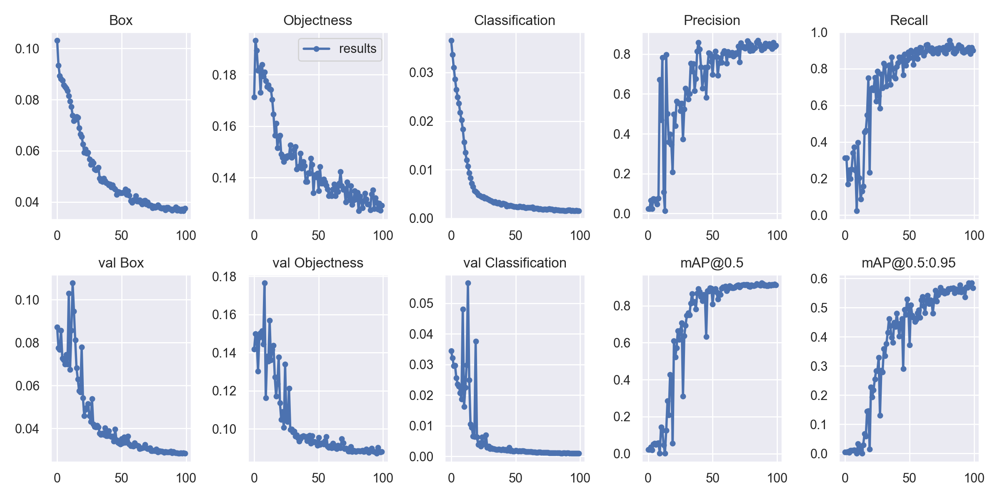

In [28]:
# we can also output some older school graphs if the tensor board isn't working for whatever reason... 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename=r'D:\yolov5_roboflow\yolov5\runs\train\yolov5s_results\results.png', width=1000)  # view results.png

### Curious? Visualize Our Training Data with Labels

After training starts, view `train*.jpg` images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in [YOLOv4](https://arxiv.org/abs/2004.10934).

GROUND TRUTH TRAINING DATA:


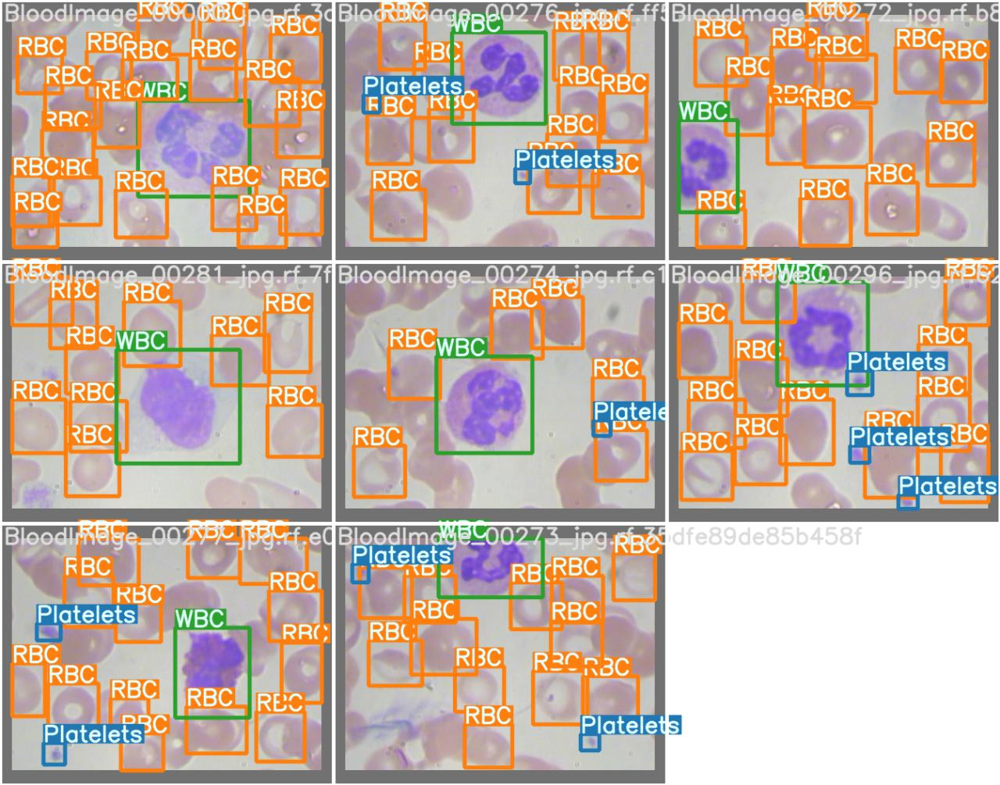

In [29]:
# first, display our ground truth data 
print("GROUND TRUTH TRAINING DATA:")
Image(filename=r'D:\yolov5_roboflow\yolov5\runs\train\yolov5s_results\test_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA:


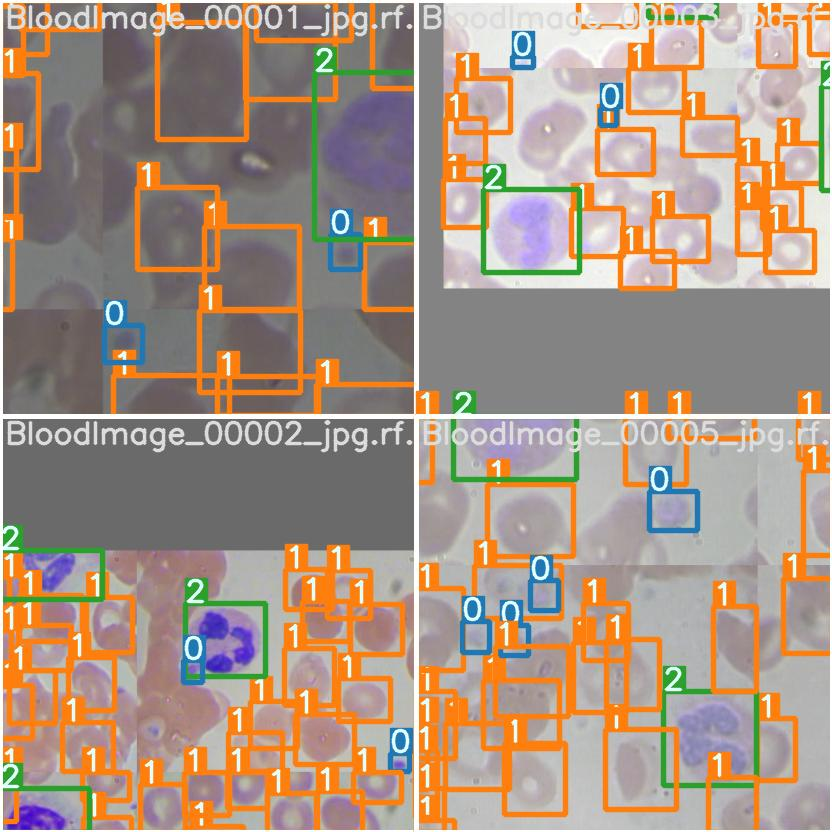

In [30]:
# print out an augmented training example
print("GROUND TRUTH AUGMENTED TRAINING DATA:")
Image(filename=r'D:/yolov5_roboflow/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

#Run Inference  With Trained Weights
Run inference with a pretrained checkpoint on contents of `test/images` folder downloaded from Roboflow.

In [33]:
# when we ran this, we saw .007 second inference time. That is 140 FPS on a TESLA P100!
# use the best weights!
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.4 --source ../test/images --save-txt --save-conf

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, img_size=416, iou_thres=0.45, name='exp', project='runs/detect', save_conf=True, save_txt=True, source='../test/images', update=False, view_img=False, weights=['runs/train/yolov5s_results/weights/best.pt'])
Fusing layers... 
image 1/36 D:\yolov5_roboflow\yolov5\..\test\images\BloodImage_00038_jpg.rf.63d04b5c9db95f32fa7669f72e4903ca.jpg: 320x416 2 Plateletss, 20 RBCs, 1 WBC, Done. (0.031s)
image 2/36 D:\yolov5_roboflow\yolov5\..\test\images\BloodImage_00044_jpg.rf.589ee3d351cb6d9a3f7b7a942da5370a.jpg: 320x416 2 Plateletss, 15 RBCs, 2 WBCs, Done. (0.015s)
image 3/36 D:\yolov5_roboflow\yolov5\..\test\images\BloodImage_00062_jpg.rf.1cecc20a21ac39cb54cf532081a1e893.jpg: 320x416 1 Platelets, 14 RBCs, 1 WBC, Done. (0.014s)
image 4/36 D:\yolov5_roboflow\yolov5\..\test\images\BloodImage_00090_jpg.rf.5267690cb6a13608d39b0424bef3c9b4.jpg: 320x416 3 Plateletss, 15 RBCs, 1 WBC, Done. (0.015s)
image

YOLOv5 v4.0-126-g886f1c0 torch 1.10.0+cu113 CUDA:0 (NVIDIA GeForce RTX 3050 Laptop GPU, 4095.5MB)

C:\Users\sthul\anaconda3\envs\yolo_torch\lib\site-packages\torch\functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ..\aten\src\ATen\native\TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Model Summary: 224 layers, 7059304 parameters, 0 gradients, 16.3 GFLOPS


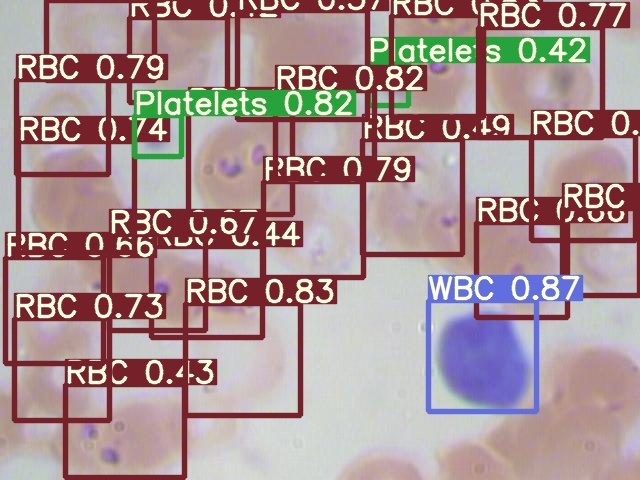

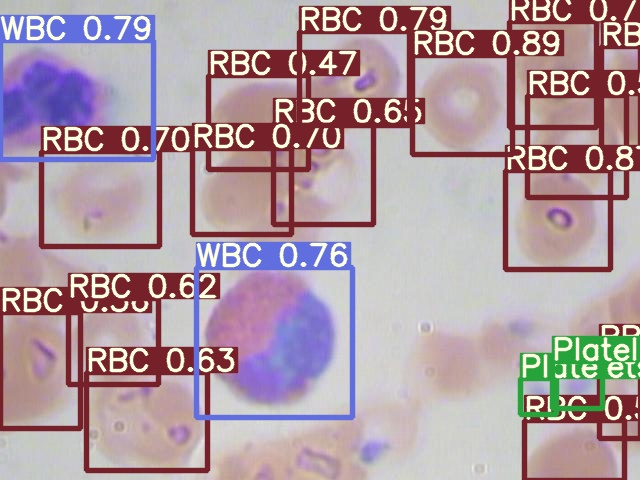

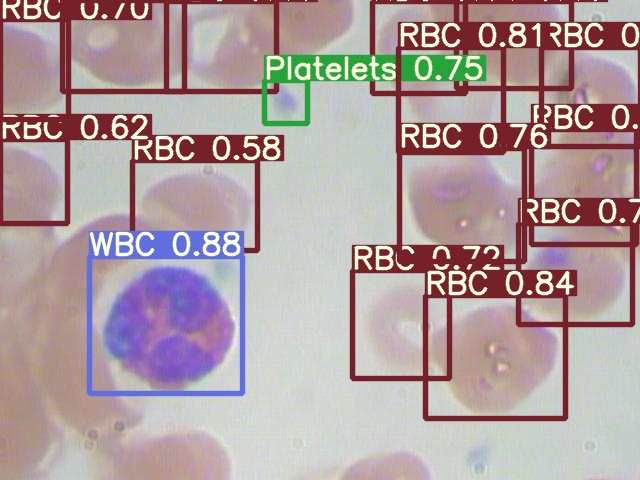

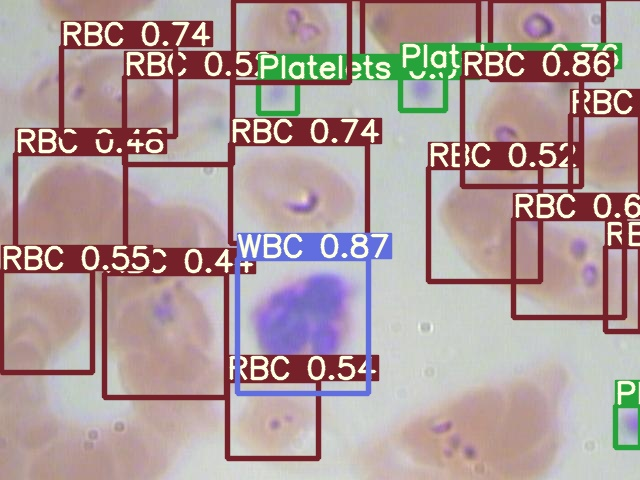

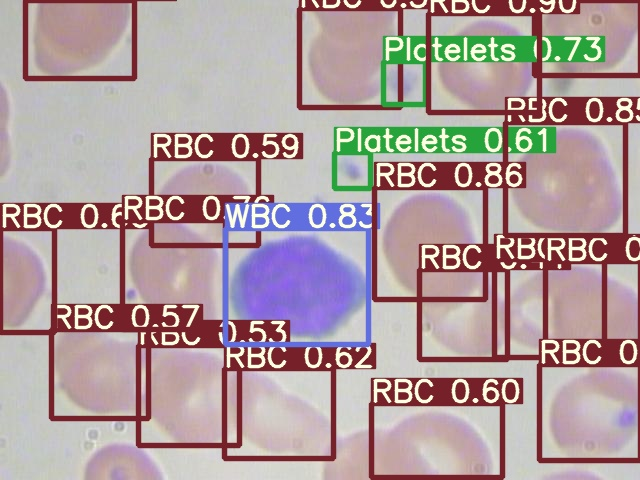

...

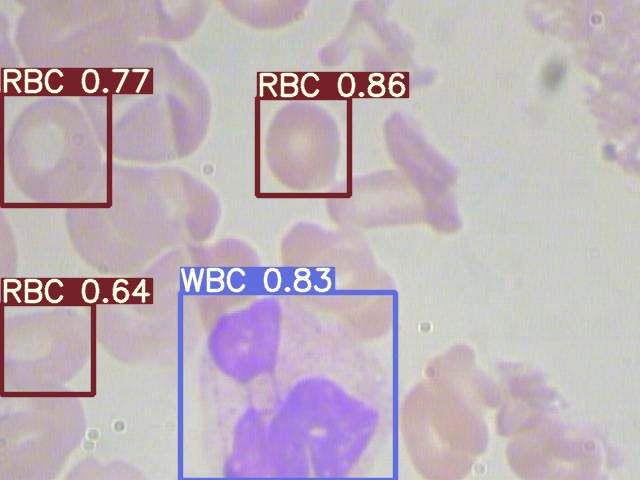

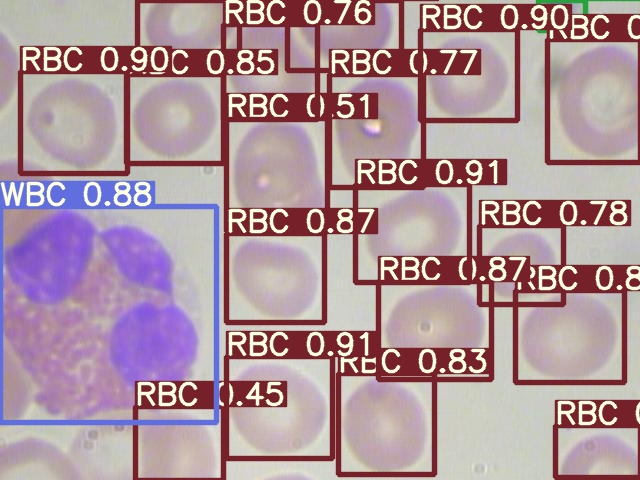

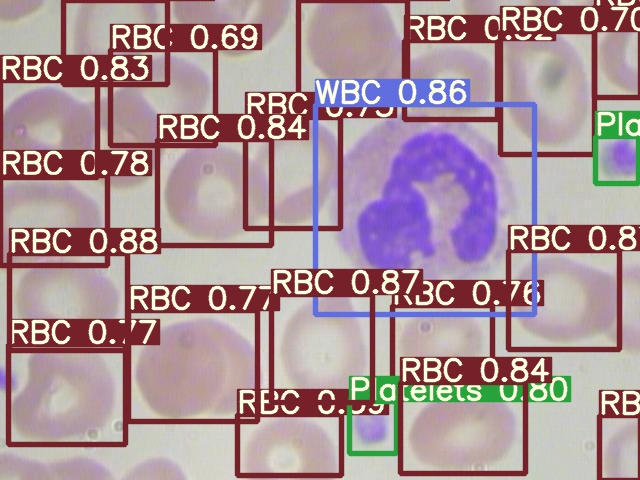

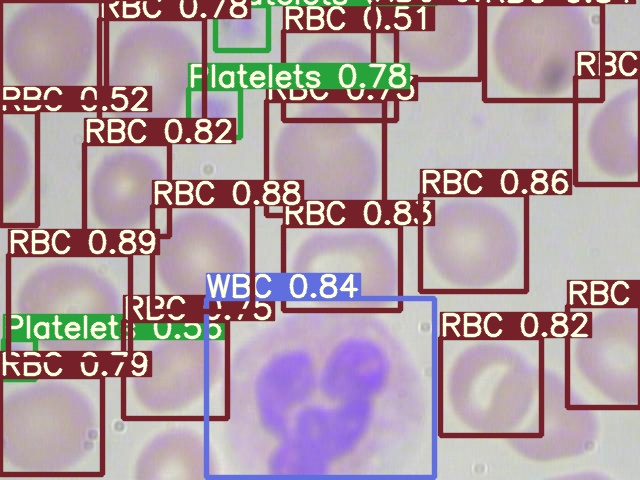

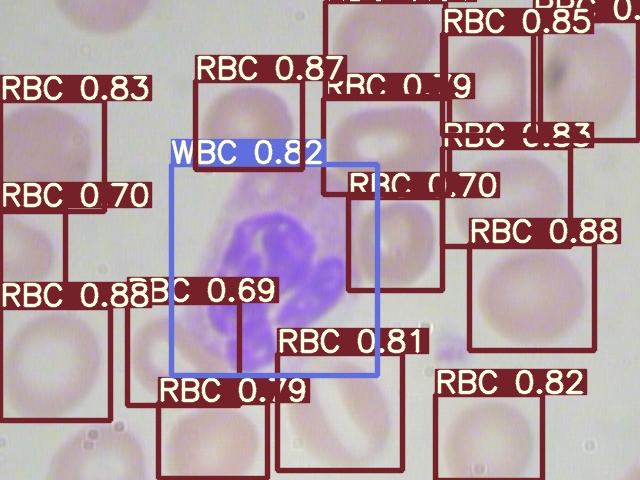

In [37]:
#display inference on ALL test images
#this looks much better with longer training above

import glob
from IPython.display import Image, display

for imageName in glob.glob(r'D:/yolov5_roboflow/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")